In [1]:
import glob
for path in glob.glob("**/data.mat", recursive=True):
    print(path)


exp/datasets/anes_data/simu/1/data.mat
exp/datasets/anes_data/simu/2/data.mat
exp/datasets/anes_data/simu/3/data.mat
exp/datasets/anes_data/simu/4/data.mat
exp/datasets/anes_data/vivo/data.mat


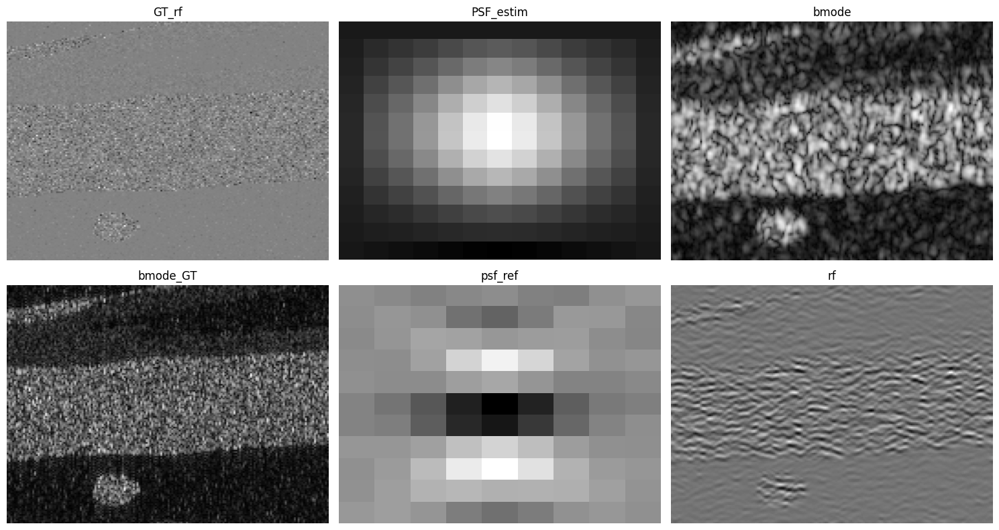

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# Variables to visualize (6 in total)
variables_to_plot = ['GT_rf', 'PSF_estim', 'bmode', 'bmode_GT', 'psf_ref', 'rf']

# Create 2 rows and 3 columns subplot
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()  # Flatten for easy indexing

for i, var in enumerate(variables_to_plot):
    if var not in mat_data:
        axes[i].set_title(f"{var} (Not Found)")
        axes[i].axis('off')
        continue

    data = mat_data[var]
    img = data[:, :, 0] if data.ndim == 3 else data

    axes[i].imshow(img, cmap='gray', aspect='auto')
    axes[i].set_title(var)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


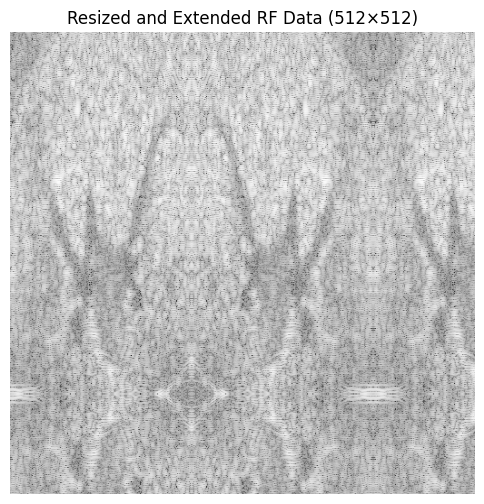

In [4]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file (adjust the path as needed)
mat_path = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(mat_path)

# Extract RF data (shape should be [401, 200])
rf = data['rf']

# --- MATLAB-style resizing and mirroring ---
data2 = rf.copy()  # (401, 200)
result = np.zeros((512, 512), dtype=rf.dtype)

# Fill left: original RF
result[:401, :200] = data2

# Fill middle: horizontally flipped RF
result[:401, 200:400] = np.fliplr(data2)

# Fill right: first 112 columns of RF
result[:401, 400:] = data2[:, :112]

# Bottom rows: mirror flip of rows 291:401
temp = result[290:401, :]
result[401:, :] = np.flipud(temp)

# --- Visualize in log-compressed scale ---
plt.figure(figsize=(6, 6))
plt.imshow(20 * np.log10(np.abs(result) + 1e-6), cmap='gray', aspect='auto')
plt.title("Resized and Extended RF Data (512×512)")
plt.axis('off')
plt.show()


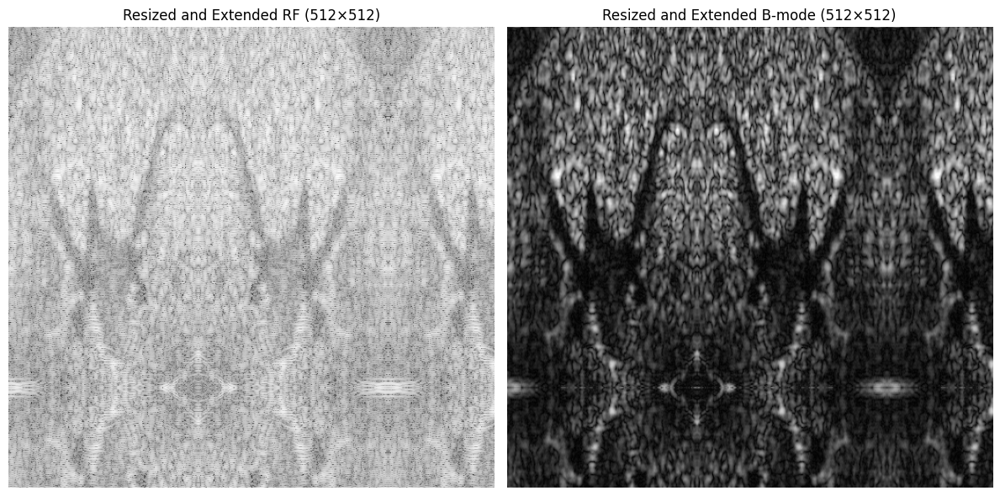

In [7]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file (adjust the path as needed)
mat_path = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(mat_path)

# Extract RF and B-mode data
rf = data['rf']           # shape: (401, 200)
bmode = data['bmode']     # shape: (401, 200)

# --- MATLAB-style resizing and mirroring for RF ---
data2 = rf.copy()
rf_resized = np.zeros((512, 512), dtype=rf.dtype)
rf_resized[:401, :200] = data2
rf_resized[:401, 200:400] = np.fliplr(data2)
rf_resized[:401, 400:] = data2[:, :112]
temp_rf = rf_resized[290:401, :]
rf_resized[401:, :] = np.flipud(temp_rf)

# --- Same resizing and mirroring for B-mode ---
data2_bmode = bmode.copy()
bmode_resized = np.zeros((512, 512), dtype=bmode.dtype)
bmode_resized[:401, :200] = data2_bmode
bmode_resized[:401, 200:400] = np.fliplr(data2_bmode)
bmode_resized[:401, 400:] = data2_bmode[:, :112]
temp_bmode = bmode_resized[290:401, :]
bmode_resized[401:, :] = np.flipud(temp_bmode)

# --- Visualize both ---
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(20 * np.log10(np.abs(rf_resized) + 1e-6), cmap='gray', aspect='auto')
plt.title("Resized and Extended RF (512×512)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bmode_resized, cmap='gray', aspect='auto')
plt.title("Resized and Extended B-mode (512×512)")
plt.axis('off')

plt.tight_layout()
plt.show()


### Resizing :
Load GT_rf from exp/datasets/anes_data/simu/1/data.mat

Resize it to 256×256 using horizontal and vertical mirroring

Save the resized data in .mat format to input/Simu/resized_rf_gt.mat

Resized RF GT saved to: input/Simu/1/resized_rf_gt.mat


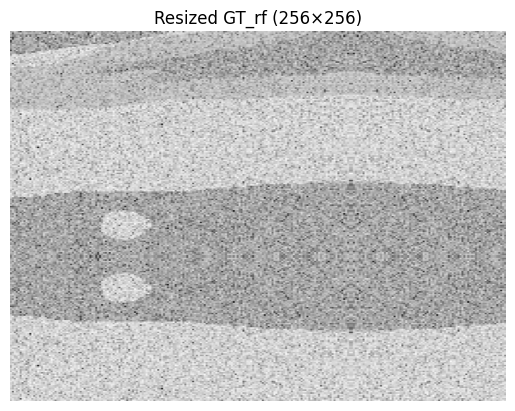

In [13]:
import numpy as np
import scipy.io
import os
import matplotlib.pyplot as plt

# Step 1: Load the GT_rf data
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
data = scipy.io.loadmat(mat_path)
gt_rf = data['GT_rf']  # Shape: (156, 176)

# Step 2: Resize to 256x256 using mirroring
target_h, target_w = 256, 256
h, w = gt_rf.shape

# Horizontal mirroring
gt_rf_resized = gt_rf.copy()
while gt_rf_resized.shape[1] < target_w:
    to_add = np.fliplr(gt_rf_resized)[:, :min(target_w - gt_rf_resized.shape[1], w)]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=1)

# Vertical mirroring
while gt_rf_resized.shape[0] < target_h:
    to_add = np.flipud(gt_rf_resized)[:min(target_h - gt_rf_resized.shape[0], h), :]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=0)

# Step 3: Save to input/Simu
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)
save_path = os.path.join(output_dir, "resized_rf_gt.mat")
scipy.io.savemat(save_path, {"GT_rf_resized": gt_rf_resized})

print(f"Resized RF GT saved to: {save_path}")

# (Optional) Step 4: Visualize
plt.imshow(20 * np.log10(np.abs(gt_rf_resized) + 1e-6), cmap='gray', aspect='auto')
plt.title("Resized GT_rf (256×256)")
plt.axis('off')
plt.show()


Resized RF GT saved to: input/Simu/1/resized_rf_gt.mat


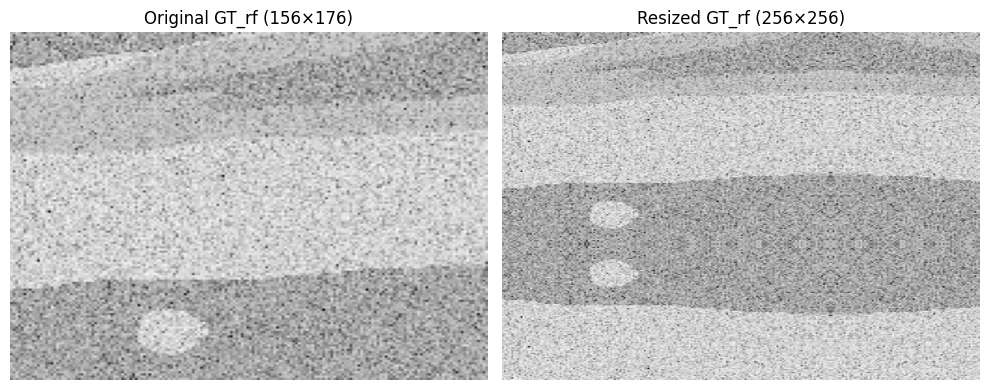

In [3]:
import numpy as np
import scipy.io
import os
import matplotlib.pyplot as plt

# Step 1: Load the original RF
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
data = scipy.io.loadmat(mat_path)
gt_rf = data['GT_rf']  # Original shape: (156, 176)

# Step 2: Resize to 256x256 using mirroring
target_h, target_w = 256, 256
h, w = gt_rf.shape

# Horizontal mirroring
gt_rf_resized = gt_rf.copy()
while gt_rf_resized.shape[1] < target_w:
    to_add = np.fliplr(gt_rf_resized)[:, :min(target_w - gt_rf_resized.shape[1], w)]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=1)

# Vertical mirroring
while gt_rf_resized.shape[0] < target_h:
    to_add = np.flipud(gt_rf_resized)[:min(target_h - gt_rf_resized.shape[0], h), :]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=0)

# Step 3: Save to input/Simu
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)
save_path = os.path.join(output_dir, "resized_rf_gt.mat")
scipy.io.savemat(save_path, {"GT_rf_resized": gt_rf_resized})
print(f"Resized RF GT saved to: {save_path}")

# Step 4: Visualize original and resized
def to_log_db(rf, epsilon=1e-6):
    return 20 * np.log10(np.abs(rf) + epsilon)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(to_log_db(gt_rf), cmap='gray', aspect='auto')
plt.title(f"Original GT_rf ({h}×{w})")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(to_log_db(gt_rf_resized), cmap='gray', aspect='auto')
plt.title("Resized GT_rf (256×256)")
plt.axis('off')

plt.tight_layout()
plt.show()


✅ Resized RF GT saved to: input/Simu/1/resized_rf_gt.mat


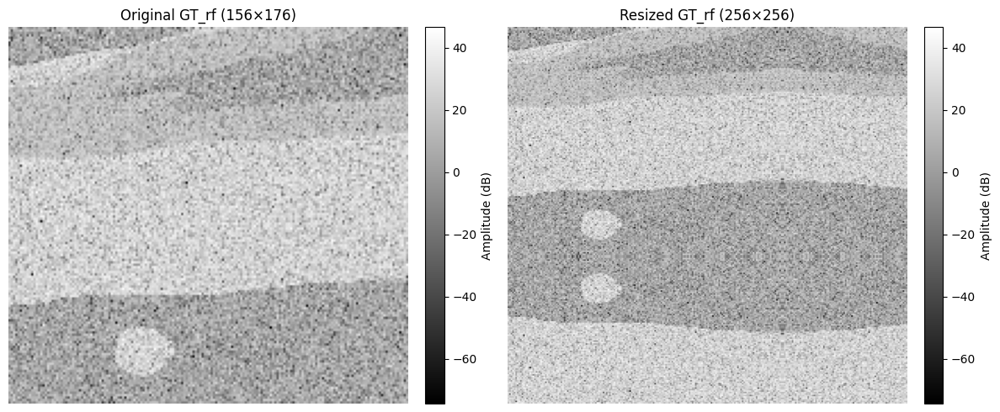

In [4]:
import numpy as np
import scipy.io
import os
import matplotlib.pyplot as plt

# Step 1: Load original RF data
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
data = scipy.io.loadmat(mat_path)
gt_rf = data['GT_rf']  # Shape: (156, 176)

# Step 2: Resize to 256x256 using mirroring
target_h, target_w = 256, 256
h, w = gt_rf.shape

# Horizontal mirroring
gt_rf_resized = gt_rf.copy()
while gt_rf_resized.shape[1] < target_w:
    to_add = np.fliplr(gt_rf_resized)[:, :min(target_w - gt_rf_resized.shape[1], w)]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=1)

# Vertical mirroring
while gt_rf_resized.shape[0] < target_h:
    to_add = np.flipud(gt_rf_resized)[:min(target_h - gt_rf_resized.shape[0], h), :]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=0)

# Step 3: Save resized data
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)
save_path = os.path.join(output_dir, "resized_rf_gt.mat")
scipy.io.savemat(save_path, {"GT_rf_resized": gt_rf_resized})
print(f"✅ Resized RF GT saved to: {save_path}")

# Step 4: Visualization function with log compression and colorbar
def show_rf_with_colorbar(data, title, ax):
    log_data = 20 * np.log10(np.abs(data) + 1e-6)
    img = ax.imshow(log_data, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label="Amplitude (dB)")

# Step 5: Plot original and resized RF
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

show_rf_with_colorbar(gt_rf, f"Original GT_rf ({h}×{w})", axes[0])
show_rf_with_colorbar(gt_rf_resized, f"Resized GT_rf (256×256)", axes[1])

plt.tight_layout()
plt.show()


# Updated Script (No Log, With Colorbars)

✅ Resized RF GT saved to: input/Simu/1/resized_rf_gt.mat


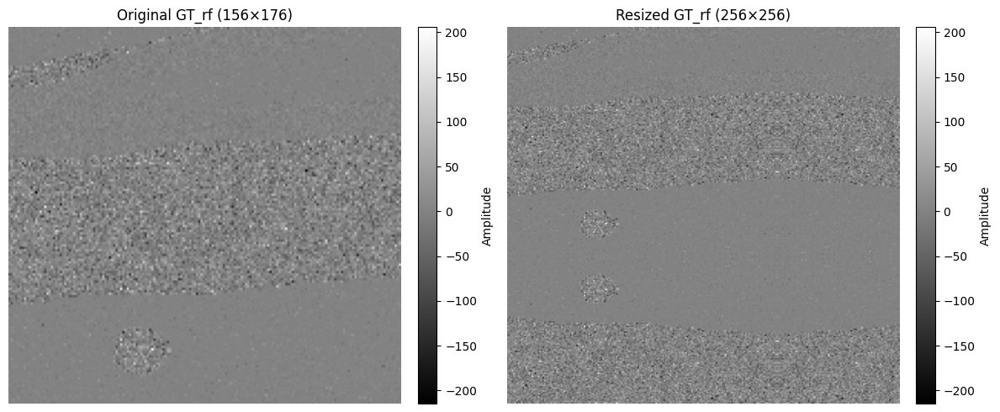

In [5]:
import numpy as np
import scipy.io
import os
import matplotlib.pyplot as plt

# Step 1: Load original RF data
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
data = scipy.io.loadmat(mat_path)
gt_rf = data['GT_rf']  # Shape: (156, 176)

# Step 2: Resize to 256x256 using mirroring
target_h, target_w = 256, 256
h, w = gt_rf.shape

gt_rf_resized = gt_rf.copy()
while gt_rf_resized.shape[1] < target_w:
    to_add = np.fliplr(gt_rf_resized)[:, :min(target_w - gt_rf_resized.shape[1], w)]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=1)

while gt_rf_resized.shape[0] < target_h:
    to_add = np.flipud(gt_rf_resized)[:min(target_h - gt_rf_resized.shape[0], h), :]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=0)

# Step 3: Save resized RF
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)
save_path = os.path.join(output_dir, "resized_rf_gt.mat")
scipy.io.savemat(save_path, {"GT_rf_resized": gt_rf_resized})
print(f"✅ Resized RF GT saved to: {save_path}")

# Step 4: Visualization function (no log)
def show_rf_with_colorbar(data, title, ax):
    img = ax.imshow(data, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label="Amplitude")

# Step 5: Plot original and resized RF
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

show_rf_with_colorbar(gt_rf, f"Original GT_rf ({h}×{w})", axes[0])
show_rf_with_colorbar(gt_rf_resized, "Resized GT_rf (256×256)", axes[1])

plt.tight_layout()
plt.show()


✅ Resized RF GT saved to: input/Simu/1/resized_rf_gt.mat


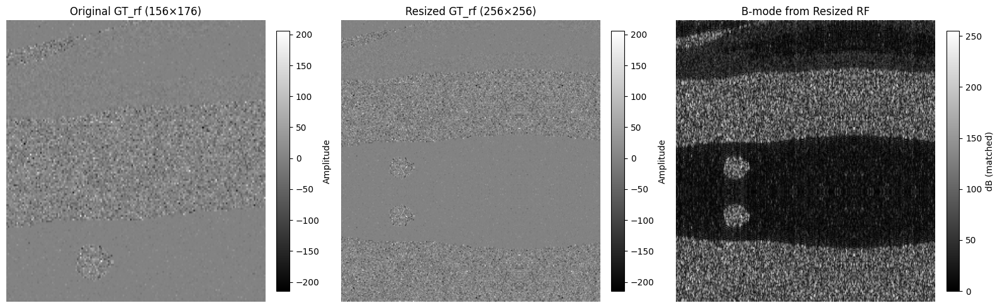

In [7]:
import numpy as np
import scipy.io

# load a B-mode image (or RF envelope)
bmode = scipy.io.loadmat("input/Simu/1/bmode_GT.mat")["bmode_GT"]  # shape (H,W)

# define two ROIs manually (as [y0:y1, x0:x1])
roi_speckle = bmode[100:164, 100:164]      # uniform region
roi_contrast1 = bmode[200:264,  50:114]    # e.g. lesion
roi_contrast2 = bmode[200:264, 200:264]    # background

# speckle SNR
mu_s, sigma_s = roi_speckle.mean(), roi_speckle.std()
snr_speckle = mu_s / (sigma_s + 1e-12)

# contrast-to-noise ratio
mu1, sigma1 = roi_contrast1.mean(), roi_contrast1.std()
mu2, sigma2 = roi_contrast2.mean(), roi_contrast2.std()
cnr = abs(mu1 - mu2) / np.sqrt(sigma1**2 + sigma2**2 + 1e-12)

print(f"Speckle SNR: {snr_speckle:.2f}")
print(f"CNR:         {cnr:.2f}")


In [8]:
!python degradation.py \
  --input_mat input/Simu/1/resized_rf_gt.mat \
  --key GT_rf_resized \
  --psf_path exp/datasets/anes_data/simu/1/psf_GT_1.mat \
  --sigma_0 0.01 \
  --output_dir input/Simu/1


🔍 Loaded RF shape: (256, 256)
🔍 Tensor for degradation: (1, 3, 256, 256)
✅ Found PSF key: psf_ref
🔍 Degraded tensor shape: (1, 3, 256, 256)
🔍 Degraded numpy shape: (256, 256)
✅ Saved:
  • input/Simu/1/ground_truth.mat
  • input/Simu/1/degraded_y0.mat


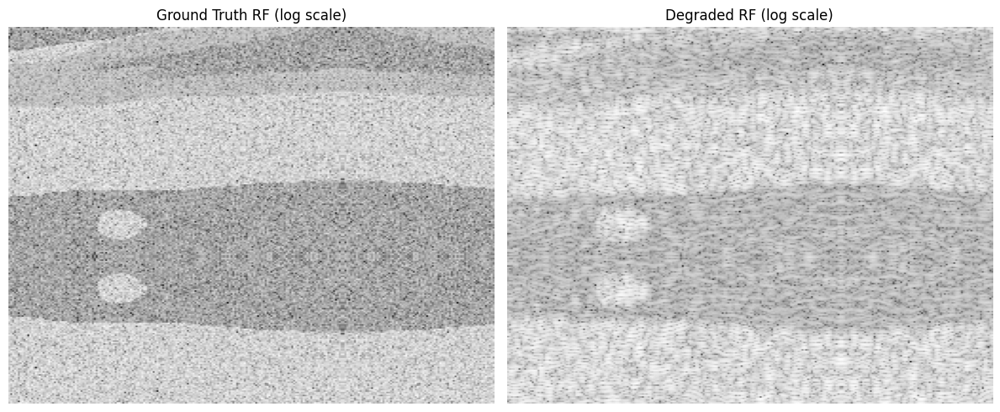

In [9]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the resized GT RF and degraded RF from Simu 1
gt_path = "input/Simu/1/ground_truth.mat"
deg_path = "input/Simu/1/degraded_y0.mat"

gt_mat = scipy.io.loadmat(gt_path)
deg_mat = scipy.io.loadmat(deg_path)

gt_rf = gt_mat["GT_rf_resized"]
rf_degraded = deg_mat["rf_degraded"]

# Convert both to log-compressed scale for better visual interpretation
def to_log_scale(rf, epsilon=1e-6):
    return 20 * np.log10(np.abs(rf) + epsilon)

gt_log = to_log_scale(gt_rf)
deg_log = to_log_scale(rf_degraded)

# Plot side-by-side
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(gt_log, cmap='gray', aspect='auto')
plt.title("Ground Truth RF (log scale)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(deg_log, cmap='gray', aspect='auto')
plt.title("Degraded RF (log scale)")
plt.axis('off')

plt.tight_layout()
plt.show()


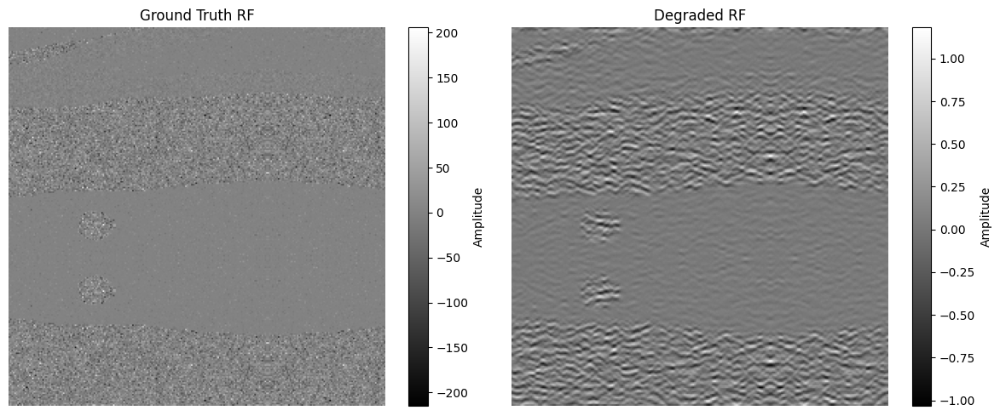

In [12]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt

# Load ground truth and degraded RFs
gt_mat = scipy.io.loadmat("input/Simu/1/ground_truth.mat")
deg_mat = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")

gt_rf = gt_mat["GT_rf_resized"]
rf_degraded = deg_mat["rf_degraded"]

# Plot RFs side by side (no log scale)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(gt_rf, cmap='gray', aspect='auto')
plt.title("Ground Truth RF")
plt.axis('off')
plt.colorbar(label="Amplitude")

plt.subplot(1, 2, 2)
plt.imshow(rf_degraded, cmap='gray', aspect='auto')
plt.title("Degraded RF")
plt.axis('off')
plt.colorbar(label="Amplitude")

plt.tight_layout()
plt.show()


In [1]:
import numpy as np
import scipy.io

# --- Load your data ---
gt = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"].astype(np.float64)
deg = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"].astype(np.float64)

# --- Compute RMS(signal) and RMS(error) ---
rms_signal = np.sqrt(np.mean(gt**2))
rms_error  = np.sqrt(np.mean((gt - deg)**2))

# --- SNR of degraded w.r.t. GT (in dB) ---
snr_degraded_db = 20.0 * np.log10(rms_signal / (rms_error + 1e-12))

print(f"SNR of degraded RF vs. GT: {snr_degraded_db:.2f} dB")


SNR of degraded RF vs. GT: -0.02 dB


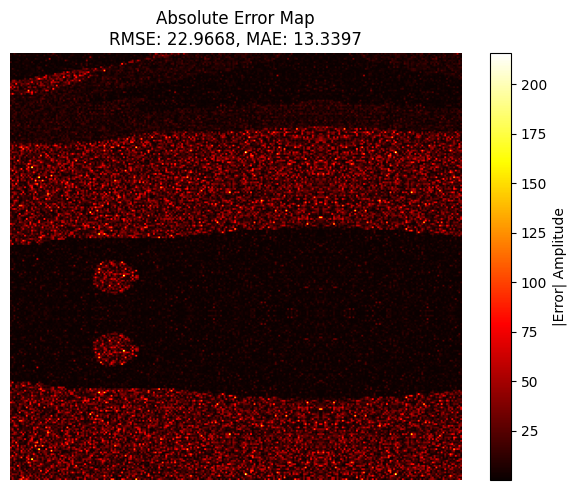

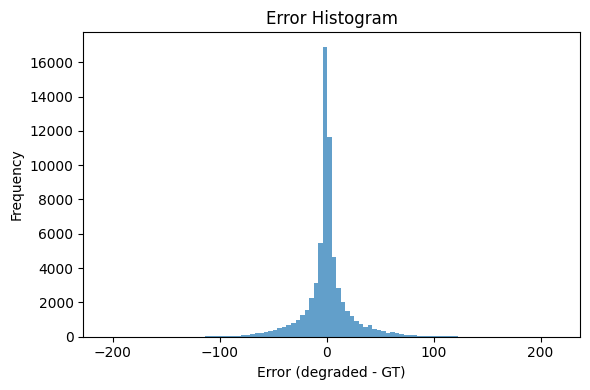

ROI-based SNR: nan dB
CNR: 0.01


/tmp/ipykernel_2257473/2903007157.py:48: RuntimeWarning: invalid value encountered in log10
  print(f"ROI-based SNR: {20*np.log10(snr_roi):.2f} dB")


In [2]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load RFs
gt = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"]
deg = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]

# Compute error metrics
error = deg - gt
abs_error = np.abs(error)
rmse = np.sqrt(np.mean(error**2))
mae = np.mean(abs_error)

# Plot error map
plt.figure(figsize=(6,5))
plt.imshow(abs_error, cmap='hot', aspect='auto')
plt.title(f"Absolute Error Map\nRMSE: {rmse:.4f}, MAE: {mae:.4f}")
plt.axis('off')
plt.colorbar(label="|Error| Amplitude")
plt.tight_layout()
plt.show()

# Plot histogram of error
plt.figure(figsize=(6,4))
plt.hist(error.flatten(), bins=100, alpha=0.7)
plt.title("Error Histogram")
plt.xlabel("Error (degraded - GT)")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Example ROI-based SNR and CNR
# Define ROIs: signal ROI (center 64x64), noise ROI (corner 64x64)
h, w = gt.shape
roi_size = 64
# center ROI for signal
cy, cx = h//2, w//2
signal_roi = gt[cy-roi_size//2:cy+roi_size//2, cx-roi_size//2:cx+roi_size//2]
# top-left ROI for background
noise_roi = gt[:roi_size, :roi_size]

mean_signal = np.mean(signal_roi)
std_noise = np.std(noise_roi)
snr_roi = mean_signal / std_noise
cnr = (np.mean(signal_roi) - np.mean(noise_roi)) / std_noise

print(f"ROI-based SNR: {20*np.log10(snr_roi):.2f} dB")
print(f"CNR: {cnr:.2f}")


--------------------------------------------------
Ultrasound Data Degradation Metrics:
--------------------------------------------------
MSE (dB): 27.22 dB
SNR (dB): -0.02 dB
PSNR (dB): 19.04 dB
RMSE (dB): 27.22 dB
NRMSE (dB): -25.25 dB
--------------------------------------------------


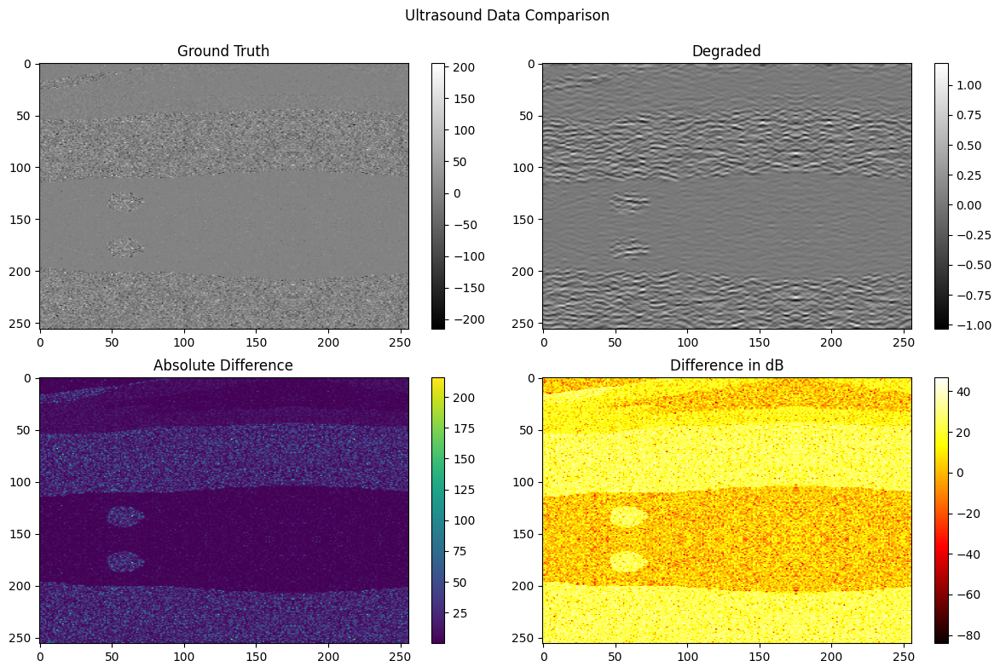

In [4]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

def calculate_mse_db(gt, degraded):
    """
    Calculate Mean Squared Error in dB
    
    MSE_dB = 10 * log10(MSE)
    """
    mse = np.mean((gt - degraded) ** 2)
    mse_db = 10 * np.log10(mse)
    return mse_db

def calculate_snr_db(gt, degraded):
    """
    Calculate Signal-to-Noise Ratio in dB
    
    SNR_dB = 10 * log10(signal_power / noise_power)
    """
    signal_power = np.mean(gt ** 2)
    noise = gt - degraded
    noise_power = np.mean(noise ** 2)
    
    # Avoid division by zero
    if noise_power == 0:
        return float('inf')
    
    snr = signal_power / noise_power
    snr_db = 10 * np.log10(snr)
    return snr_db

def calculate_psnr_db(gt, degraded):
    """
    Calculate Peak Signal-to-Noise Ratio in dB
    
    PSNR_dB = 10 * log10(MAX^2 / MSE)
    """
    max_val = np.max(gt)
    mse = np.mean((gt - degraded) ** 2)
    
    # Avoid division by zero
    if mse == 0:
        return float('inf')
    
    psnr = (max_val ** 2) / mse
    psnr_db = 10 * np.log10(psnr)
    return psnr_db

def calculate_rmse_db(gt, degraded):
    """
    Calculate Root Mean Squared Error in dB
    """
    rmse = np.sqrt(np.mean((gt - degraded) ** 2))
    rmse_db = 20 * np.log10(rmse)  # Using 20*log10 for amplitude
    return rmse_db

def calculate_nrmse_db(gt, degraded):
    """
    Calculate Normalized Root Mean Squared Error in dB
    """
    rmse = np.sqrt(np.mean((gt - degraded) ** 2))
    gt_range = np.max(gt) - np.min(gt)
    nrmse = rmse / gt_range
    nrmse_db = 20 * np.log10(nrmse)  # Using 20*log10 for amplitude
    return nrmse_db

def visualize_degradation(gt, degraded, title="Ultrasound Data Comparison"):
    """
    Visualize the ground truth and degraded data
    """
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 2, 1)
    plt.imshow(gt, aspect='auto', cmap='gray')
    plt.title('Ground Truth')
    plt.colorbar()
    
    plt.subplot(2, 2, 2)
    plt.imshow(degraded, aspect='auto', cmap='gray')
    plt.title('Degraded')
    plt.colorbar()
    
    plt.subplot(2, 2, 3)
    plt.imshow(np.abs(gt - degraded), aspect='auto', cmap='viridis')
    plt.title('Absolute Difference')
    plt.colorbar()
    
    plt.subplot(2, 2, 4)
    plt.imshow(20 * np.log10(np.abs(gt - degraded) + 1e-10), aspect='auto', cmap='hot')
    plt.title('Difference in dB')
    plt.colorbar()
    
    plt.tight_layout()
    plt.suptitle(title)
    plt.subplots_adjust(top=0.9)
    plt.show()

# Load GT and degraded RF data
gt = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"].astype(np.float64)
deg = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"].astype(np.float64)

# Ensure the arrays have the same shape
if gt.shape != deg.shape:
    print(f"Warning: Ground truth shape {gt.shape} doesn't match degraded data shape {deg.shape}")
    # You might need to resize or crop the data here
    # For now, we'll just use the minimum dimensions to crop both arrays
    min_rows = min(gt.shape[0], deg.shape[0])
    min_cols = min(gt.shape[1], deg.shape[1])
    gt = gt[:min_rows, :min_cols]
    deg = deg[:min_rows, :min_cols]

# Calculate degradation metrics
mse_db = calculate_mse_db(gt, deg)
snr_db = calculate_snr_db(gt, deg)
psnr_db = calculate_psnr_db(gt, deg)
rmse_db = calculate_rmse_db(gt, deg)
nrmse_db = calculate_nrmse_db(gt, deg)

print("-" * 50)
print("Ultrasound Data Degradation Metrics:")
print("-" * 50)
print(f"MSE (dB): {mse_db:.2f} dB")
print(f"SNR (dB): {snr_db:.2f} dB")
print(f"PSNR (dB): {psnr_db:.2f} dB")
print(f"RMSE (dB): {rmse_db:.2f} dB")
print(f"NRMSE (dB): {nrmse_db:.2f} dB")
print("-" * 50)

# Visualize the data and degradation
visualize_degradation(gt, deg)

In [13]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Normalize both RFs to [0, 1] for fair comparison
def normalize_01(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-8)

gt_norm = normalize_01(gt_rf)
deg_norm = normalize_01(rf_degraded)

# Compute metrics
psnr_val = psnr(gt_norm, deg_norm, data_range=1.0)
ssim_val = ssim(gt_norm, deg_norm, data_range=1.0)

# Display
print(f"📊 PSNR: {psnr_val:.2f} dB")
print(f"📊 SSIM: {ssim_val:.4f}")


📊 PSNR: 18.45 dB
📊 SSIM: 0.0988


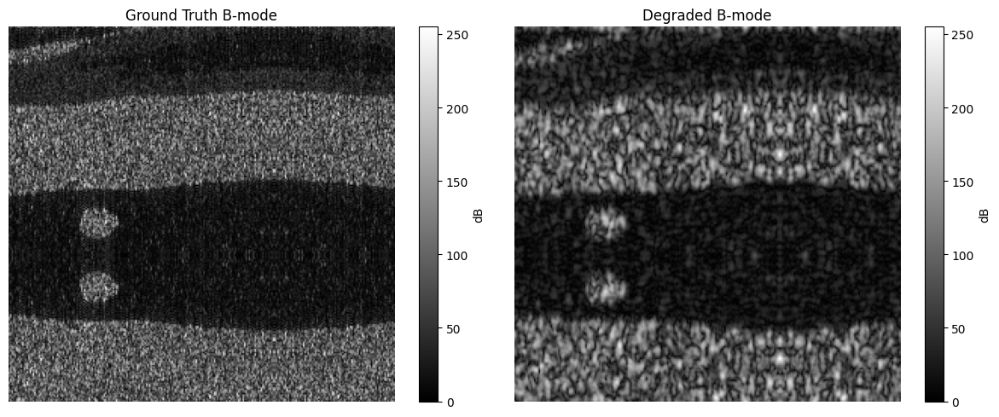

In [14]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# Load RFs
gt_mat = scipy.io.loadmat("input/Simu/1/ground_truth.mat")
deg_mat = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")
bmode_gt_ref = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

gt_rf = gt_mat["GT_rf_resized"]
rf_degraded = deg_mat["rf_degraded"]

# Function to convert RF to B-mode (with histogram matching)
def rf_to_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# Convert both to B-mode
bmode_gt = rf_to_bmode(gt_rf, bmode_gt_ref)
bmode_deg = rf_to_bmode(rf_degraded, bmode_gt_ref)

# Plot side-by-side
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(bmode_gt, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode")
plt.axis('off')
plt.colorbar(label="dB")

plt.subplot(1, 2, 2)
plt.imshow(bmode_deg, cmap='gray', aspect='auto')
plt.title("Degraded B-mode")
plt.axis('off')
plt.colorbar(label="dB")

plt.tight_layout()
plt.show()


In [15]:
# Normalize for PSNR/SSIM
def normalize_01(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-8)

bmode_gt_norm = normalize_01(bmode_gt)
bmode_deg_norm = normalize_01(bmode_deg)

# Compute metrics
psnr_bmode = psnr(bmode_gt_norm, bmode_deg_norm, data_range=1.0)
ssim_bmode = ssim(bmode_gt_norm, bmode_deg_norm, data_range=1.0)

psnr_bmode, ssim_bmode

(16.388790075668396, 0.23615994542005783)

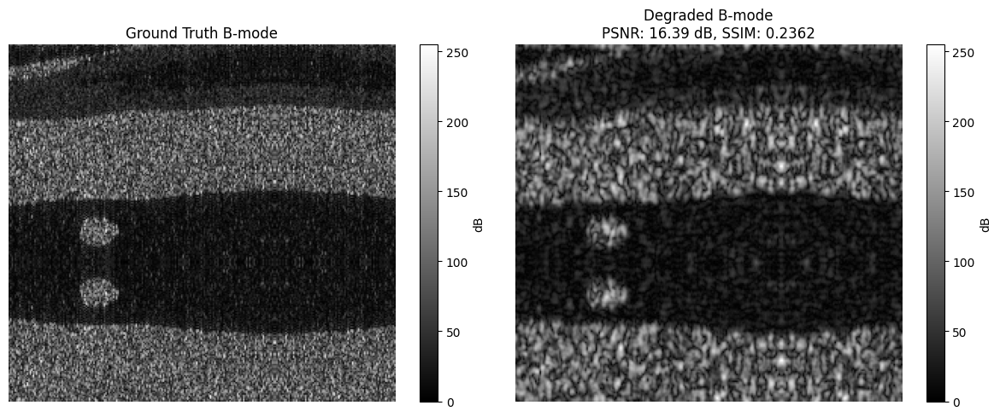

In [16]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load RFs and B-mode reference
gt_mat = scipy.io.loadmat("input/Simu/1/ground_truth.mat")
deg_mat = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")
ref_mat = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")

gt_rf = gt_mat["GT_rf_resized"]
rf_degraded = deg_mat["rf_degraded"]
bmode_gt_ref = ref_mat["bmode_GT"]

# Function to convert RF to B-mode (with histogram matching)
def rf_to_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# Convert to B-mode
bmode_gt = rf_to_bmode(gt_rf, bmode_gt_ref)
bmode_deg = rf_to_bmode(rf_degraded, bmode_gt_ref)

# Normalize to [0, 1] for fair PSNR/SSIM
def normalize_01(x):
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

bmode_gt_norm = normalize_01(bmode_gt)
bmode_deg_norm = normalize_01(bmode_deg)

# Compute metrics
psnr_bmode = psnr(bmode_gt_norm, bmode_deg_norm, data_range=1.0)
ssim_bmode = ssim(bmode_gt_norm, bmode_deg_norm, data_range=1.0)

# Plot side-by-side with metrics in title
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(bmode_gt, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode")
plt.axis('off')
plt.colorbar(label="dB")

plt.subplot(1, 2, 2)
plt.imshow(bmode_deg, cmap='gray', aspect='auto')
plt.title(f"Degraded B-mode\nPSNR: {psnr_bmode:.2f} dB, SSIM: {ssim_bmode:.4f}")
plt.axis('off')
plt.colorbar(label="dB")

plt.tight_layout()
plt.show()


In [17]:
!python run_ddrm_restoration.py \
  --degraded_mat  input/Simu/1/degraded_y0.mat \
  --gt_mat        input/Simu/1/ground_truth.mat \
  --psf_path      exp/datasets/anes_data/simu/1/psf_GT_1.mat \
  --model_path    exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --config        deblur_us.yml \
  --timesteps     100 \
  --eta           0.9 \
  --etaB          1.0 \
  --sigma_0       0.01 \
  --output_dir    input/Simu/1


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
✅ PSF loaded (key='psf_ref', shape=(11, 9))
INFO - main.py - 2025-05-20 11:33:54,217 - Using device: cuda
✅ Model checkpoint loaded
100it [00:44,  2.25it/s]
✅ Saved input/Simu/1/restored_ddrm.mat
PSNR: 25.30 dB   SSIM: 0.4431


In [1]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt

# Load RFs
gt = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"]
deg = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rest = scipy.io.loadmat("input/Simu/1/restored_ddrm.mat")["rf_restored"]

# Plot all three side-by-side
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(gt, cmap='gray', aspect='auto')
plt.title("Ground Truth RF")
plt.axis('off')
plt.colorbar(label="Amplitude")

plt.subplot(1, 3, 2)
plt.imshow(deg, cmap='gray', aspect='auto')
plt.title("Degraded RF")
plt.axis('off')
plt.colorbar(label="Amplitude")

plt.subplot(1, 3, 3)
plt.imshow(rest, cmap='gray', aspect='auto')
plt.title("Restored RF (DDRM)")
plt.axis('off')
plt.colorbar(label="Amplitude")

plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'input/Simu/1/restored_ddrm.mat'

Original RF shape: 156 × 176
Cropped shapes: (156, 176) (156, 176) (156, 176)


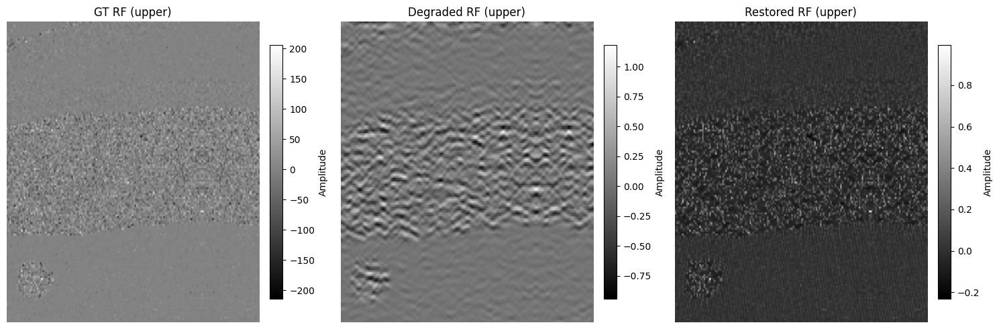

In [3]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# 1) Load the .mat and inspect RF shape
mat = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
gt_rf = mat["GT_rf"]            # your ground-truth RF key
orig_h, orig_w = gt_rf.shape    # dynamically read (e.g. 156,176)

print(f"Original RF shape: {orig_h} × {orig_w}")
# Load 256x256 RFs from /mnt/data
gt_full   = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"]
deg_full  = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rest_full = scipy.io.loadmat("input/Simu/1/restored_ddrm.mat")["rf_restored"]

# Compute horizontal starting index for centered crop
H, W = gt_full.shape
start_w = (W - orig_w) // 2

# Crop from upper portion: top orig_h rows, centered width
gt_crop   = gt_full[0:orig_h, start_w:start_w+orig_w]
deg_crop  = deg_full[0:orig_h, start_w:start_w+orig_w]
rest_crop = rest_full[0:orig_h, start_w:start_w+orig_w]

# Verify shapes
print("Cropped shapes:", gt_crop.shape, deg_crop.shape, rest_crop.shape)

# Plot side-by-side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, title in zip(axes,
                          [gt_crop, deg_crop, rest_crop],
                          ["GT RF (upper)", "Degraded RF (upper)", "Restored RF (upper)"]):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Amplitude")

plt.tight_layout()
plt.show()


In [6]:
import scipy.io
import os

# Directory to save the cropped .mat files
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)

# Save each cropped RF to .mat
scipy.io.savemat(os.path.join(output_dir, "gt_crop_upper.mat"),   {"gt_crop_upper": gt_crop})
scipy.io.savemat(os.path.join(output_dir, "deg_crop_upper.mat"),  {"deg_crop_upper": deg_crop})
scipy.io.savemat(os.path.join(output_dir, "rest_crop_upper.mat"), {"rest_crop_upper": rest_crop})

# Confirm saving
saved_files = os.listdir(output_dir)
saved_files


['.ipynb_checkpoints',
 'resized_rf_gt.mat',
 'ground_truth.mat',
 'degraded_y0.mat',
 'restored_ddrm.mat',
 'gt_crop_upper.mat',
 'deg_crop_upper.mat',
 'rest_crop_upper.mat']

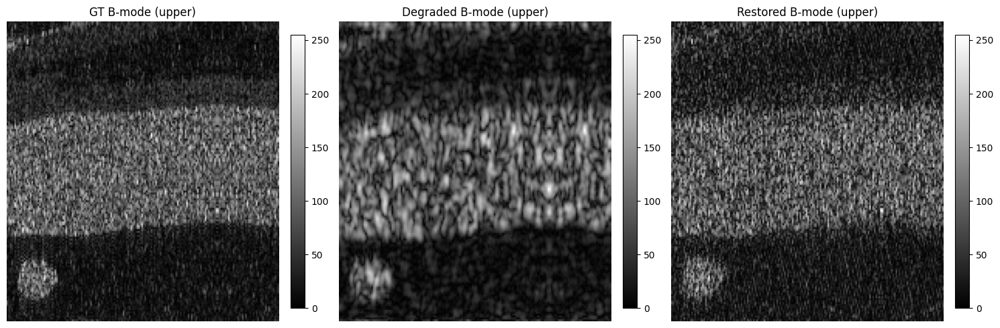

In [7]:
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# Load reference B-mode
ref_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# B-mode conversion function
def rf_to_bmode(RF, ref, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref[:, :, 0] if ref.ndim == 3 else ref
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# Apply to cropped RFs
bmode_gt_crop   = rf_to_bmode(gt_crop, ref_bmode)
bmode_deg_crop  = rf_to_bmode(deg_crop, ref_bmode)
bmode_rest_crop = rf_to_bmode(rest_crop, ref_bmode)

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, title in zip(
    axes,
    [bmode_gt_crop, bmode_deg_crop, bmode_rest_crop],
    ["GT B-mode (upper)", "Degraded B-mode (upper)", "Restored B-mode (upper)"]
):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


In [4]:
def calculate_psnr_db(gt, degraded):
    """
    Calculate Peak Signal-to-Noise Ratio in dB
    
    PSNR_dB = 10 * log10(MAX^2 / MSE)
    """
    max_val = np.max(gt)
    mse = np.mean((gt - degraded) ** 2)
    
    # Avoid division by zero
    if mse == 0:
        return float('inf')
    
    psnr = (max_val ** 2) / mse
    psnr_db = 10 * np.log10(psnr)
    return psnr_db


In [5]:
# Step 5: PSNR function
def calculate_psnr_db(gt, degraded):
    max_val = np.max(gt)
    mse = np.mean((gt - degraded) ** 2)
    if mse == 0:
        return float('inf')
    return 10 * np.log10((max_val ** 2) / mse)

# Step 6: Compute PSNRs
psnr_deg  = calculate_psnr_db(gt_crop, deg_crop)
psnr_rest = calculate_psnr_db(gt_crop, rest_crop)

print("📊 PSNR (Degraded vs GT):", f"{psnr_deg:.2f} dB")
print("📊 PSNR (Restored vs GT):", f"{psnr_rest:.2f} dB")

📊 PSNR (Degraded vs GT): 19.50 dB
📊 PSNR (Restored vs GT): 19.55 dB


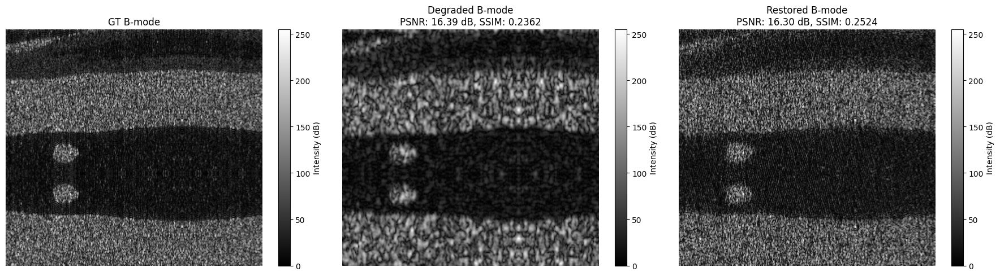

In [20]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load RF data
gt = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"]
deg = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rest = scipy.io.loadmat("input/Simu/1/restored_ddrm.mat")["rf_restored"]
ref_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# Convert RF to B-mode
def rf_to_bmode(RF, ref, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref[:, :, 0] if ref.ndim == 3 else ref
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

b_gt   = rf_to_bmode(gt, ref_bmode)
b_deg  = rf_to_bmode(deg, ref_bmode)
b_rest = rf_to_bmode(rest, ref_bmode)

# Normalize for PSNR/SSIM
def normalize_01(x): return (x - x.min()) / (x.max() - x.min() + 1e-8)
b_gt_n   = normalize_01(b_gt)
b_deg_n  = normalize_01(b_deg)
b_rest_n = normalize_01(b_rest)

# Compute metrics
psnr_deg  = psnr(b_gt_n, b_deg_n, data_range=1.0)
ssim_deg  = ssim(b_gt_n, b_deg_n, data_range=1.0)
psnr_rest = psnr(b_gt_n, b_rest_n, data_range=1.0)
ssim_rest = ssim(b_gt_n, b_rest_n, data_range=1.0)

# Plot
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(b_gt, cmap='gray', aspect='auto')
plt.title("GT B-mode")
plt.axis('off')
plt.colorbar(label="Intensity (dB)")

plt.subplot(1, 3, 2)
plt.imshow(b_deg, cmap='gray', aspect='auto')
plt.title(f"Degraded B-mode\nPSNR: {psnr_deg:.2f} dB, SSIM: {ssim_deg:.4f}")
plt.axis('off')
plt.colorbar(label="Intensity (dB)")

plt.subplot(1, 3, 3)
plt.imshow(b_rest, cmap='gray', aspect='auto')
plt.title(f"Restored B-mode\nPSNR: {psnr_rest:.2f} dB, SSIM: {ssim_rest:.4f}")
plt.axis('off')
plt.colorbar(label="Intensity (dB)")

plt.tight_layout()
plt.show()
